In [1]:
# Providing functions to load ECG data (single or multi lead) from the LUDB and plot the data with annotations.
import wfdb
import neurokit2 as nk
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# pip install wfdb

In [3]:
# pip install neurokit2

In [4]:
# DATA_FOLDER = "K://Tel/Disin/copy/data - Copy"
DATA_FOLDER = "K://Tel/Disin/praktikum/git/prominence-delineator-main/new_data - Copy"

In [5]:
class ProminenceDelineator:
    """A class implementing a prominence based delineation algorithm [1], detecting morphology waves (P, Q, R, S, T) in
    an ECG signal. This class allows for processing single and multi-lead ECG signals and incorporates functionalities
    for ECG cleaning, R-peak detection [2] and muli-lead wave correction, providing a complete ECG delineation pipeline.

    Args
    -----
    sampling_frequency : float
        The sampling frequency of the ECG signal.
    max_r_rise_time : float, optional
        The maximum rise time for the R wave (in seconds). Default is 0.12.
    typical_st_segment : float, optional
        The typical duration of the ST segment (in seconds). Default is 0.15.
    max_pr_interval : float, optional
        The maximum duration of the PR interval (in seconds). Default is 0.3.
    max_qrs_interval : float, optional
        The maximum duration of the QRS interval (in seconds). Default is 0.18.

    References
    -----------
    [1] Emrich, J., Gargano, A., Koka, T., and Muma, M. (2024), "Physiology-Informed ECG Delineation
    Based on Peak Prominence", 32nd European Signal Processing Conference (EUSIPCO), 2024
    [2] J. Emrich, T. Koka, S. Wirth, M. Muma, "Accelerated Sample-Accurate R-peak Detectors Based on
    Visibility Graphs", 31st European Signal Processing Conference (EUSIPCO), 2023

    """

    def __init__(
        self,
        sampling_frequency,
        max_r_rise_time=0.12,
        typical_st_segment=0.15,
        max_pr_interval=0.3,
        max_qrs_interval=0.18,
    ):

        if sampling_frequency <= 0:
            raise ValueError(
                f"'sampling_frequency' has to be a positive non-zero value (got {sampling_frequency})."
            )
        if max_r_rise_time <= 0:
            raise ValueError(
                f"'max_r_rise_time' has to be a positive non-zero value (got {max_r_rise_time})."
            )
        if typical_st_segment <= 0:
            raise ValueError(
                f"'typical_st_segment' has to be a positive non-zero value (got {typical_st_segment})."
            )
        if max_pr_interval <= 0:
            raise ValueError(
                f"'max_pr_interval' has to be a positive non-zero value (got {max_pr_interval})."
            )
        if max_qrs_interval <= 0:
            raise ValueError(
                f"'max_qrs_interval' has to be a positive non-zero value (got {max_qrs_interval})."
            )
        if sampling_frequency <= 0:
            raise ValueError(
                f"'sampling_frequency' has to be a positive non-zero value (got {sampling_frequency})."
            )

        # physiology parameters motivated by literature
        self.fs = sampling_frequency
        self.max_r_rise_time = int(max_r_rise_time * self.fs)
        self.typical_st_segment = int(typical_st_segment * self.fs)
        self.max_pr_interval = int(max_pr_interval * self.fs)
        self.max_qrs_interval = int(max_qrs_interval * self.fs)

        # basepoint_intervals chosen as narrow intervals since classic prominence calculation is non-robust
        self.max_p_basepoint_interval = 0.1 * self.fs
        self.max_r_basepoint_interval = 0.1 * self.fs
        self.max_t_basepoint_interval = 0.2 * self.fs

    def find_waves_multilead(
        self,
        sig_multilead,
        rpeaks_multilead,
        multilead_correction=False,
        tol=0.15,
        accept_forall_factor=2 / 3,
        accept_factor=1 / 3,
    ):
        """Delineate ECG waves in multiple leads of a provided ECG signal.

        Args
        ----
        sig_multilead : list
            A list of multiple arrays or lists representing the filtered ECG signal in each lead.
        rpeaks_multilead: list
            A list of multiple arrays or lists representing the R-peaks in each lead.
        multilead_correction : bool, optional
            If True, the detected waves will be corrected based on the detection from the other leads. Defaults to
            False.
        accept_forall_factor : float, optional
            The minimum proportion of leads in which a wave needs to be detected, so that its corrected position is
            introduced in the remaining leads. Only has an effect if 'multilead_correction' is True. Defaults to 2/3.
        accept_factor : float, optional
            The minimum proportion of leads in which a wave needs to be detected so that it will not be discarded. Only
            has an effect if 'multilead_correction' is True. Defaults to 1/3.
        tol : float, optional
            Tolerance factor for correcting wave positions (in seconds). Defaults to 0.15.

        Returns
        -------
        dict: A dictionary containing the detected waves in each lead. The keys represent the wave types ('P', 'Q',
        'R', 'S', 'T', 'P_on', 'P_off', 'R_on', 'R_off', 'T_on', 'T_off') and each value is a lists containing
        predicted wave positions (as a list) for each lead.

        """

        if not isinstance(sig_multilead, list) or not all(
            isinstance(lead, (list, np.ndarray)) for lead in sig_multilead
        ):
            raise ValueError(
                "Invalid format for 'sig_multilead'. It should be a list of multiple arrays or lists."
            )

        if len(sig_multilead) != len(rpeaks_multilead):
            raise ValueError(
                "The length of 'sig_multilead' and 'rpeaks_multilead' should be the same, i.e., the number of"
                "provided leads should match."
            )
        if not isinstance(rpeaks_multilead, list) or not all(
            isinstance(lead, (list, np.ndarray)) for lead in rpeaks_multilead
        ):
            raise ValueError(
                "Invalid format for 'rpeaks_multilead'. It should be a list of multiple arrays or lists."
            )

        waves = {
            "P": [],
            "R": rpeaks_multilead,
            "T": [],
            "P_on": [],
            "P_off": [],
            "R_on": [],
            "R_off": [],
            "T_on": [],
            "T_off": [],
        }

        # process all leads
        for l, lead in enumerate(sig_multilead):
            result = self.find_waves(lead, rpeaks=waves["R"][l])
            # append result for lead
            for wave in waves.keys():
                waves[wave].append(result[wave])

        # correct multi-lead predictions
        if multilead_correction:
            for wave, leads in waves.items():
                waves[wave] = self._correct_multiLeads(
                    leads,
                    tol=tol,
                    accept_forall_factor=accept_forall_factor,
                    accept_factor=accept_factor,
                )

        return waves

    def find_waves(self, sig, rpeaks):
        """Delineate ECG waves for the given single lead ECG signal.

        Args
        ----
        sig : ndarray
            The input signal representing a single unfiltered ECG lead.
        rpeaks : ndarray
            The R-peak positions of the signal.

        Returns
        -------
        dict: A dictionary of ndarrays containing the indices of the detected waves. The keys are 'P', 'R', 'T',
        'P_on', 'P_off', 'R_on', 'R_off', 'T_on', 'T_off'.

        """

        if sig is None:
            raise ValueError("The input signal 'sig' is None.")

        waves = {
            "P": [],
            "R": [],
            "T": [],
            "P_on": [],
            "P_off": [],
            "R_on": [],
            "R_off": [],
            "T_on": [],
            "T_off": [],
        }

        # calculate RR intervals
        rr = self._calc_rr_intervals(rpeaks)

        # initialize variables
        l = 0
        for i in range(len(rpeaks)):
            # 1. split signal into segments
            rpeak_pos = min(rpeaks[i], rr[i] // 2)
            l = rpeaks[i] - rpeak_pos
            r = rpeaks[i] + rr[i + 1] // 2
            s = sig[l:r]

            current_wave = {
                "R": rpeak_pos,
            }

            # 2. find local extrema in signal
            local_maxima = scipy.signal.find_peaks(s)[0]
            local_minima = scipy.signal.find_peaks(-s)[0]
            local_extrema = np.concatenate((local_maxima, local_minima))

            # 3. compute prominence weight
            weight_maxima = self._calc_prominence(local_maxima, s, current_wave["R"])
            weight_minima = self._calc_prominence(
                local_minima, s, current_wave["R"], minima=True
            )

            if local_extrema.any():
                # find waves
                self._find_q_wave(s, weight_minima, current_wave)
                self._find_s_wave(s, weight_minima, current_wave)
                self._find_p_wave(local_maxima, weight_maxima, current_wave)
                self._find_t_wave(
                    local_extrema, (weight_minima + weight_maxima), current_wave
                )
                self._find_on_offsets(
                    s, local_minima, local_maxima, weight_maxima, current_wave
                )
            print(current_wave)

            # append waves
            for key in waves:
                if key in current_wave:
                    waves[key].append(current_wave[key] + l)
        waves["R"] = rpeaks

        # cast into np.array int
        for key in waves:
            waves[key] = np.array(waves[key], dtype=int)
        print(waves)
        return waves

    def clean_ecg(self, sig):
        """Cleaning the given ECG signal.

        Args
        ----
        sig : ndarray
            The input signal representing a single unfiltered ECG lead.

        Returns
        -------
        ndarray: The cleaned ECG signal.

        Note
        ----
        The 'neurokit2' module is required for this method to run. Please install it first (`pip install neurokit2`).

        """
        try:

            import neurokit2 as nk

            if isinstance(sig, (list, np.ndarray)) and all(
                isinstance(lead, (list, np.ndarray)) for lead in sig
            ):
                # multi-lead signal
                return [nk.ecg_clean(lead, sampling_rate=self.fs) for lead in sig]
            else:
                # single lead signal
                return nk.ecg_clean(sig, sampling_rate=self.fs)

        except ImportError:
            raise ImportError(
                "The 'neurokit2' module is required for this method to run.",
                "Please install it first (`pip install neurokit2`).",
            )

    def find_rpeaks(self, sig):
        """Detecting R-peaks using the FastNVG detector.

        Args
        ----
        sig : ndarray
            The input signal representing a single unfiltered ECG lead.

        Returns
        -------
        ndarray: The R-peak positions of the signal.

        Note
        ----
        The 'vg-beat-detectors' module is required for this method to run. Please install it first (`pip install
        vg-beat-detectors`).

        """
        try:
            from vg_beat_detectors import FastNVG

            detector = FastNVG(sampling_frequency=self.fs)

            if isinstance(sig, (list, np.ndarray)) and all(
                isinstance(lead, (list, np.ndarray)) for lead in sig
            ):
                # multi-lead signal
                return [detector.find_peaks(lead) for lead in sig]
            else:
                # single lead signal
                return detector.find_peaks(sig)

        except ImportError:
            raise ImportError(
                "The 'vg-beat-detectors' module is required for this method to run.",
                "Please install it first (`pip install vg-beat-detectors`).",
            )

    def _calc_rr_intervals(self, rpeaks):
        """Calculating RR intervals from R-peaks.
        Intervals at segment boundaries are inferred by pre/succeeding segments.

        """
        rr = np.diff(rpeaks)
        rr = np.insert(rr, 0, min(rr[0], 2 * rpeaks[0]))
        rr = np.insert(rr, -1, min(rr[-1], 2 * rpeaks[-1]))
        return rr

    def _correct_multiLeads(
        self, predictions, tol, accept_forall_factor=2 / 3, accept_factor=1 / 3
    ):
        """Corrects the multi-leads predictions based on a tolerance value."""
        predictions = [np.array(lead).flatten() for lead in predictions]

        corr_predictions = [[] for lead in predictions]
        for m in range(len(predictions)):
            for p in predictions[m]:
                Found = [p]
                Found_in = [m]
                for l in range(m + 1, len(predictions)):
                    diff = np.abs(predictions[l] - p).astype(float)
                    i = diff <= tol * self.fs
                    if i.any():
                        Found.extend(predictions[l][i])
                        Found_in.append(l)
                        predictions[l] = predictions[l][~i]

                # add corrected annotation to all leads if found in enough leads
                if len(Found) >= len(predictions) * accept_forall_factor:
                    for c in range(len(predictions)):
                        corr_predictions[c].append(int(np.mean(Found)))
                # add corrected annotation only to the lead where it was found
                elif len(Found) >= len(predictions) * accept_factor:
                    for cx, c in enumerate(Found_in):
                        corr_predictions[c].append(int(Found[cx]))

        return [np.sort(lead) for lead in corr_predictions]

    def _correct_peak(self, sig, peak, window=0.02):
        """Correct peak towards local maxima within provided window."""

        l = peak - int(window * self.fs)
        r = peak + int(window * self.fs)
        if len(sig[l:r]) > 0:
            peaks, _ = scipy.signal.find_peaks(sig[l:r])
            return np.argmax(sig[l:r]) + l
        else:
            return peak

    def _calc_prominence(self, peaks, sig, Rpeak=None, minima=False):
        """Returns an array of the same length as sig with prominences computed for the provided peaks.
        Prominence of the R-peak is excluded if the R-peak position is given.
        """
        w = np.zeros_like(sig)

        if len(peaks) < 1:
            return w
        # get prominence
        _sig = -sig if minima else sig
        w[peaks] = scipy.signal.peak_prominences(_sig, peaks)[0]
        # optional: set rpeak prominence to zero to emphasize other peaks
        if Rpeak is not None:
            w[Rpeak] = 0
        return w

    def _find_q_wave(self, s, weight_minima, current_wave):
        if not "R" in current_wave:
            return
        q_bound = max(current_wave["R"] - self.max_r_rise_time, 0)

        current_wave["Q"] = (
            np.argmax(weight_minima[q_bound : current_wave["R"]]) + q_bound
        )

    def _find_s_wave(self, s, weight_minima, current_wave):
        if not "Q" in current_wave:
            return
        s_bound = current_wave["Q"] + self.max_qrs_interval
        s_wave = (
            np.argmax(weight_minima[current_wave["R"] : s_bound] > 0)
            + current_wave["R"]
        )
        current_wave["S"] = (
            np.argmin(s[current_wave["R"] : s_bound]) + current_wave["R"]
            if s_wave == current_wave["R"]
            else s_wave
        )

    def _find_p_wave(self, local_maxima, weight_maxima, current_wave):
        if not "Q" in current_wave:
            return
        p_candidates = local_maxima[
            (current_wave["Q"] - self.max_pr_interval <= local_maxima)
            & (local_maxima <= current_wave["Q"])
        ]
        if p_candidates.any():
            current_wave["P"] = p_candidates[np.argmax(weight_maxima[p_candidates])]

    def _find_t_wave(self, local_extrema, weight_extrema, current_wave):
        if not "S" in current_wave:
            return
        t_candidates = local_extrema[
            (current_wave["S"] + self.typical_st_segment <= local_extrema)
        ]
        if t_candidates.any():
            current_wave["T"] = t_candidates[np.argmax(weight_extrema[t_candidates])]

    def _find_on_offsets(
        self, s, local_minima, local_maxima, weight_maxima, current_wave
    ):
        if "P" in current_wave:
            _, p_on, p_off = scipy.signal.peak_prominences(
                s, [current_wave["P"]], wlen=self.max_p_basepoint_interval
            )
            if not np.isnan(p_on):
                current_wave["P_on"] = p_on[0]
            if not np.isnan(p_off):
                current_wave["P_off"] = p_off[0]

        if "T" in current_wave:
            p = -1 if np.isin(current_wave["T"], local_minima) else 1

            _, t_on, t_off = scipy.signal.peak_prominences(
                p * s, [current_wave["T"]], wlen=self.max_t_basepoint_interval
            )
            if not np.isnan(t_on):
                current_wave["T_on"] = t_on[0]
            if not np.isnan(t_off):
                current_wave["T_off"] = t_off[0]

        # correct R-peak position towards local maxima (otherwise prominence will be falsely computed)
        r_pos = self._correct_peak(s, current_wave["R"])
        _, r_on, r_off = scipy.signal.peak_prominences(
            s, [r_pos], wlen=self.max_r_basepoint_interval
        )
        if not np.isnan(r_on):
            current_wave["R_on"] = r_on[0]

        if not np.isnan(r_off):
            current_wave["R_off"] = r_off[0]


In [6]:
def load_ecg(record_name="1", LEAD_INDEX = 1, filtered=False):
    """
    Function to load an (example) ECG record from the LUDB.

    Params:
        record_name (str): The name of the ECG record to load.
        lead (str): The lead of the ECG record to load.

    Returns:
        time (ndarray): Array containing the time values of the ECG signal.
        ecg (ndarray): Array containing the preprocessed ECG signal.
        fs (int): The sampling frequency of the ECG signal.
        annotations (dict): Dictionary containing the annotations of the ECG signal.

    """

    # Load the ECG data 
    ecg_all_leads = np.load(DATA_FOLDER+'/'+record_name+'.npy')
    ecg = ecg_all_leads[:,LEAD_INDEX]
    fs = 500
    time = np.arange(ecg.size) / fs

    # Clean the ECG
    if filtered:
        ecg = nk.ecg_clean(ecg, sampling_rate=fs)

    return time, ecg, fs


In [7]:
def load_multilead_ecg(record_name="1", LEAD_INDEXES=[1,2,3], filtered=False):
    """
    Function to load multi-lead ECG data from the LUDB.

    Params:
        record_name (str): The name of the ECG record to load.
        leads (list): List of leads to load.

    Returns:
        time (array-like): Array of time values for the ECG data.
        multilead_ecg (list): List of arrays containing the loaded ECG data for each lead.
        fs (float): Sampling frequency of the ECG data.
        multilead_annotations (dict): Dictionary consisting of a list for each wave, containing each the annotations for each lead.
        
    """
    multilead_annotations = {
        'P': [],
        'R': [],
        'T': [],
        'P_on': [],
        'P_off': [],
        'R_on': [],
        'R_off': [],
        'T_on': [],
        'T_off': []
    }
    multilead_ecg = []

    # Load the ECG data for each lead
    for lead in LEAD_INDEXES:
        time, ecg, fs = load_ecg(record_name, lead, filtered=filtered)
        # Append the ECG data
        multilead_ecg.append(ecg)
        # Append the annotations
        # for wave, annotation in annotations.items():
        #     multilead_annotations[wave].append(annotation)

    return time, multilead_ecg, fs


In [8]:
# Functions to plot ECG data (single or multi lead) with annotations

def plot_waves(time, ecg, waves, title=None, xlim=[1,8]):
    """
    Plots a single ECG lead with morphology waves.

    Params:
        time (array-like): Array of time indices.
        ecg (array-like): Array of ECG signal.
        waves (dict): Dictionary containing morphology waves.
        title (str, optional): Title of the plot.
    """

    # Plotting options
    markers = [
            {'marker': '^', 'linewidth': 0, 'markersize': 6, 'markeredgewidth': 1},
            {'marker': 'x', 'linewidth': 0, 'markersize': 6, 'markeredgewidth': 2},
            {'marker': 'v', 'linewidth': 0, 'markersize': 6, 'markeredgewidth': 1}]
    colors = ['tab:blue',  'tab:green', 'tab:red' ,'tab:orange', 'tab:brown', 'tab:purple']

    morphologies = ["P", "Q", "R", "S", "T"]
    types = ["_on", "", "_off"]

    # Plot the ECG
    plt.figure(figsize=(10, 4))
    plt.plot(time, ecg, lw=0.75, color=colors[0])
    # iterate over all morphology waves
    for i, w in enumerate(morphologies):
        for t, marker in zip(types, markers):
            if not f"{w}{t}" in waves.keys():
                continue
            plt.plot(time[waves[f"{w}{t}"]], ecg[waves[f"{w}{t}"]], **marker, label=f"{w}{t}", color=colors[i+1])

    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude [mV]')
    plt.legend(loc='upper right', title='waves')
    plt.title(title)
    plt.grid(True)
    plt.xlim(xlim)
    plt.show()


In [9]:
def plot_multilead_ecg_annotations(time, multilead_ecg, multilead_annotations, LEAD_INDEXES, xlim=[1,8]):
    markers = [
            {'marker': '^', 'linewidth': 0, 'markersize': 6, 'markeredgewidth': 1},
            {'marker': 'x', 'linewidth': 0, 'markersize': 6, 'markeredgewidth': 2},
            {'marker': 'v', 'linewidth': 0, 'markersize': 6, 'markeredgewidth': 1}]
    colors = ['tab:blue',  'tab:green', 'tab:red' ,'tab:orange', 'tab:brown', 'tab:purple']

    morphologies = ["P", "Q", "R", "S", "T"]
    types = ["_on", "", "_off"]

    fig, axs = plt.subplots(len(LEAD_INDEXES), 1, figsize=(10, 2 * len(LEAD_INDEXES)), sharex=True)

    for i, lead in enumerate(LEAD_INDEXES):
        axs[i].plot(time, multilead_ecg[i], lw=0.75, color=colors[0])
        axs[i].set_ylabel('Amplitude')
        axs[i].set_title(f'Lead {lead}')

        # Plot all morphology waves
        for k, w in enumerate(morphologies):
            for t, marker in zip(types, markers):
                if not f"{w}{t}" in multilead_annotations.keys():
                    continue
                label = label=f"{w}{t}" if i == 0 else None
                axs[i].plot(time[multilead_annotations[f"{w}{t}"][i]], multilead_ecg[i][multilead_annotations[f"{w}{t}"][i]], **marker, color=colors[k+1], label=label)

        
        axs[i].set_xlim(xlim)
        axs[i].grid(True)

    axs[-1].set_xlabel('Time (s)')
    axs[0].legend(loc='center left', bbox_to_anchor=(1, -1.0), title='waves')

    plt.show()

In [10]:
import numpy as np
import scipy

In [11]:
# pip install vg-beat-detectors

{'R': 88, 'Q': 60, 'S': 101, 'P': 45, 'P_on': 21, 'P_off': 60, 'R_on': 62, 'R_off': 101}
{'R': 88, 'Q': 28, 'S': 117, 'T': 316, 'T_on': 285, 'T_off': 361, 'R_on': 62, 'R_off': 112}
{'R': 392, 'Q': 368, 'S': 407, 'P': 341, 'T': 569, 'P_on': 317, 'P_off': 366, 'T_on': 519, 'T_off': 619, 'R_on': 368, 'R_off': 407}
{'R': 481, 'Q': 452, 'S': 497, 'P': 430, 'T': 661, 'P_on': 415, 'P_off': 452, 'T_on': 611, 'T_off': 711, 'R_on': 456, 'R_off': 497}
{'R': 303, 'Q': 264, 'S': 316, 'P': 214, 'T': 474, 'P_on': 189, 'P_off': 235, 'T_on': 424, 'T_off': 524, 'R_on': 276, 'R_off': 316}
{'R': 483, 'Q': 465, 'S': 496, 'P': 440, 'T': 658, 'P_on': 415, 'P_off': 465, 'T_on': 608, 'T_off': 708, 'R_on': 465, 'R_off': 496}
{'R': 483, 'Q': 445, 'S': 501, 'P': 371, 'T': 663, 'P_on': 346, 'P_off': 383, 'T_on': 613, 'T_off': 713, 'R_on': 464, 'R_off': 508}
{'P': array([  94, 1048, 2011, 2580, 3593, 4491]), 'R': array([ 137,  314, 1099, 2062, 2669, 3636, 4603]), 'T': array([ 542, 1276, 2242, 2840, 3811, 4783]), 'P

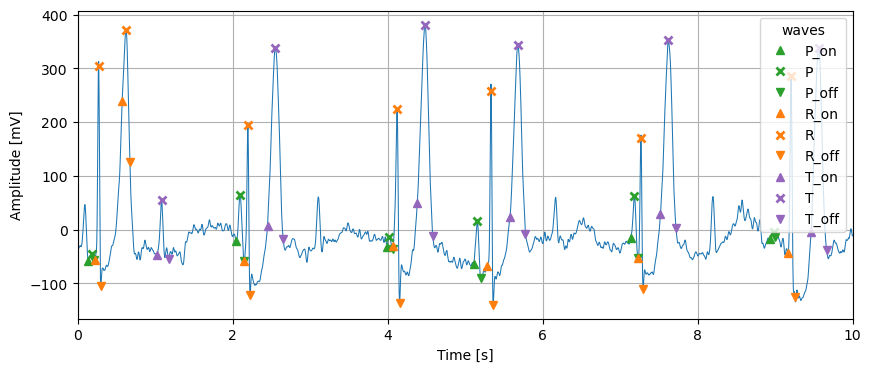

In [13]:
# Load unfiltered Data
time, ecg, fs = load_ecg(record_name="40", filtered=False)

# Create an instance of the ProminenceDelineator
PromDelineator = ProminenceDelineator(sampling_frequency=fs)

# Detect the R-peaks in the ECG signal
rpeaks = PromDelineator.find_rpeaks(ecg)

# Clean the ECG signal
ecg = PromDelineator.clean_ecg(ecg)

# Find waves in the ECG signal using the find_waves function
waves = PromDelineator.find_waves(ecg, rpeaks=rpeaks)

# Visualize the detected waves
plot_waves(time, ecg, waves, xlim=[0,10])

In [14]:
def printLeads(record_name):
    # Load unfiltered Data
    LEAD_INDEXES = [0,1,2,3,4,5,6,7,8,9,10,11]
    # record_name = "9332"
    time, multilead_ecg, fs = load_multilead_ecg(record_name , LEAD_INDEXES=LEAD_INDEXES)

    # Create an instance of the ProminenceDelineator
    PromDelineator = ProminenceDelineator(sampling_frequency=fs)

    # Detect the R-peaks in the ECG signal
    multilead_rpeaks = PromDelineator.find_rpeaks(multilead_ecg)

    # Clean the ECG signal
    multilead_ecg = PromDelineator.clean_ecg(multilead_ecg)

    # Find waves in the ECG signal using the find_waves function
    multilead_waves = PromDelineator.find_waves_multilead(multilead_ecg, rpeaks_multilead=multilead_rpeaks)

    plot_multilead_ecg_annotations(time, multilead_ecg, multilead_waves, LEAD_INDEXES, xlim=[0, 10])
    saveFile(multilead_waves, record_name)


In [15]:
import numpy as np
import pickle

# Data structure to save
def saveFile(multilead_waves, record_name):
    # File path to save the data
    file_path = './savedFilesNew/pkl/' + record_name + '.pkl'

    # Save data to a file
    with open(file_path, 'wb') as file:
            pickle.dump(multilead_waves, file)

    # Load data from the file
    with open(file_path, 'rb') as file:
            loaded_data = pickle.load(file)
    print(loaded_data)



In [ ]:
# #single ecg
# printLeads("17")

In [ ]:
#all of the ecg
import pandas as pd
import glob
import os

start_index = 121
file_path = "K://Tel/Disin/copy/data/EF_dataset_28092022_235531_metadata_all_groups_DEID_filter.csv"
df = pd.read_csv(file_path)
if start_index < len(df):
    # חזור על השורות מהאינדקס הרצוי ועד הסוף
    for index, row in df.iloc[start_index:].iterrows():
        record_name = row['index_col']
        print(record_name)
        printLeads(str(record_name))
else:
    print(f"The start index {start_index} is out of range. Please choose a value less than {len(df)}.")

{'R': 140, 'Q': 117, 'S': 183, 'P': 67, 'T': 285, 'P_on': 42, 'P_off': 92, 'T_on': 235, 'T_off': 335, 'R_on': 117, 'R_off': 164}
{'R': 235, 'Q': 207, 'S': 281, 'P': 166, 'T': 382, 'P_on': 141, 'P_off': 191, 'T_on': 332, 'T_off': 422, 'R_on': 210, 'R_off': 260}
{'R': 236, 'Q': 214, 'S': 269, 'P': 170, 'T': 385, 'P_on': 145, 'P_off': 195, 'T_on': 335, 'T_off': 386, 'R_on': 214, 'R_off': 260}
{'R': 151, 'Q': 122, 'S': 182, 'P': 89, 'T': 292, 'P_on': 64, 'P_off': 114, 'T_on': 250, 'T_off': 342, 'R_on': 125, 'R_off': 175}
{'R': 300, 'Q': 267, 'S': 327, 'P': 238, 'T': 449, 'P_on': 213, 'P_off': 263, 'T_on': 399, 'T_off': 499, 'R_on': 275, 'R_off': 325}
{'R': 268, 'Q': 244, 'S': 307, 'P': 205, 'T': 417, 'P_on': 180, 'P_off': 229, 'T_on': 367, 'T_off': 467, 'R_on': 244, 'R_off': 293}
{'R': 245, 'Q': 217, 'S': 287, 'P': 174, 'T': 393, 'P_on': 149, 'P_off': 199, 'T_on': 343, 'T_off': 432, 'R_on': 219, 'R_off': 269}
{'R': 247, 'Q': 211, 'S': 276, 'P': 181, 'T': 393, 'P_on': 156, 'P_off': 206, 'T_

C:\Users\326037777\AppData\Local\Temp\ipykernel_14212\1748144256.py:453: PeakPropertyWarning: some peaks have a prominence of 0
  _, r_on, r_off = scipy.signal.peak_prominences(


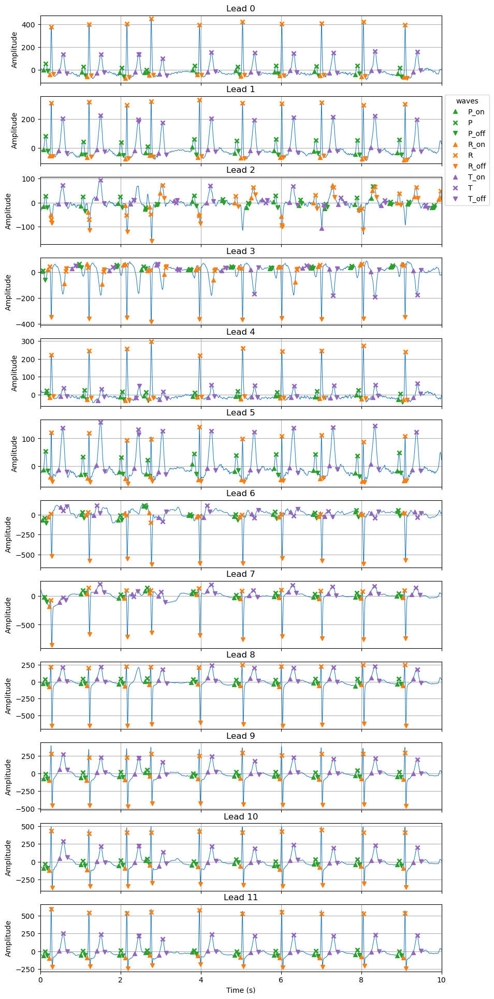

{'P': [array([  67,  541, 1016, 1323, 1924, 2459, 2941, 3440, 3952, 4478]), array([  67,  536, 1008, 1340, 1921, 2445, 2939, 3433, 3950, 4473]), array([  67,  530,  997, 1311, 1456, 1917, 2274, 2587, 2931, 3240, 3557,
       3946, 4148, 4363, 4588, 4905]), array([  37,  486,  954, 1286, 1866, 2381, 2875, 3379, 3878, 4389]), array([  82,  553, 1022, 1321, 1927, 2463, 2952, 3446, 3966, 4486]), array([  67,  532, 1007, 1340, 1920, 2443, 2938, 3430, 3950, 4471]), array([  54,  525,  998, 1296, 1869, 2436, 2927, 3420, 3940, 4463]), array([  55,  531, 1002, 1333, 1905, 2440, 2932, 3425, 3946, 4468]), array([  62,  531, 1003, 1333, 1906, 2444, 2934, 3427, 3950, 4470]), array([  65,  531, 1006, 1332, 1907, 2444, 2935, 3430, 3950, 4471]), array([  64,  532, 1005, 1331, 1913, 2444, 2935, 3432, 3951, 4473]), array([  63,  532, 1006, 1331, 1921, 2445, 2935, 3434, 3951, 4472])], 'R': [array([ 140,  610, 1082, 1385, 1986, 2522, 3012, 3506, 4027, 4548]), array([ 139,  609, 1081, 1384, 1986, 2522, 301

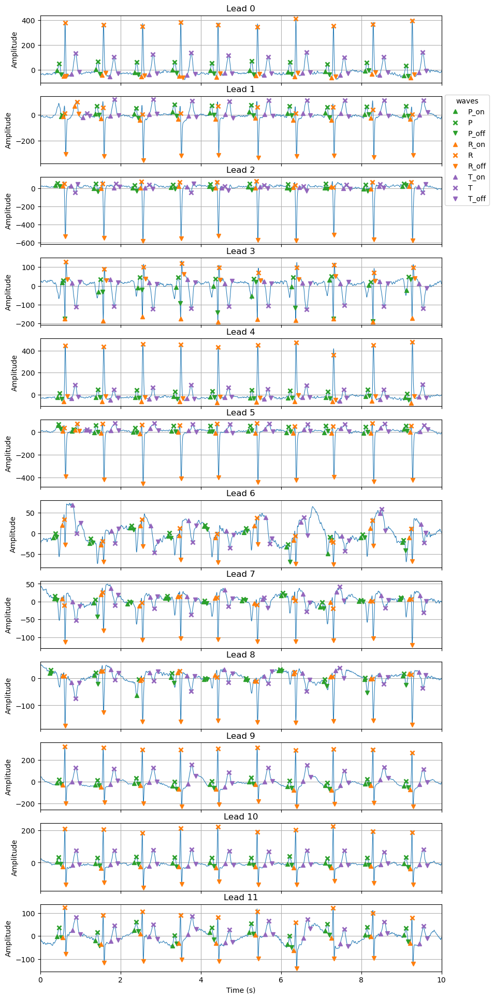

{'P': [array([ 235,  717, 1200, 1675, 2141, 2633, 3110, 3578, 4070, 4558]), array([ 273,  709, 1198, 1673, 2137, 2629, 3107, 3576, 4069, 4556]), array([ 214,  695, 1179, 1656, 2120, 2612, 3090, 3558, 4054, 4533]), array([ 285,  752, 1240, 1719, 2185, 2663, 3154, 3628, 4121, 4591]), array([ 242,  720, 1206, 1683, 2147, 2638, 3115, 3586, 4082, 4570]), array([ 231,  418,  696, 1181, 1662, 2122, 2613, 3092, 3559, 4054, 4555]), array([ 189,  628, 1140, 1611, 2053, 2566, 3087, 3607, 4019, 4526]), array([ 186,  690, 1114, 1585, 2050, 2533, 3022, 3512, 3996, 4492]), array([ 129,  691, 1229, 1642, 2054, 2564, 2993, 3544, 4051, 4534]), array([ 233,  710, 1197, 1674, 2138, 2630, 3107, 3577, 4071, 4556]), array([ 232,  711, 1198, 1675, 2140, 2629, 3108, 3578, 4071, 4558]), array([ 236,  711, 1198, 1673, 2138, 2629, 3108, 3576, 4072, 4559])], 'R': [array([ 310,  788, 1275, 1751, 2215, 2706, 3186, 3653, 4148, 4638]), array([ 308,  459,  786, 1274, 1749, 2213, 2704, 3183, 3650, 4147, 4633]), array([ 

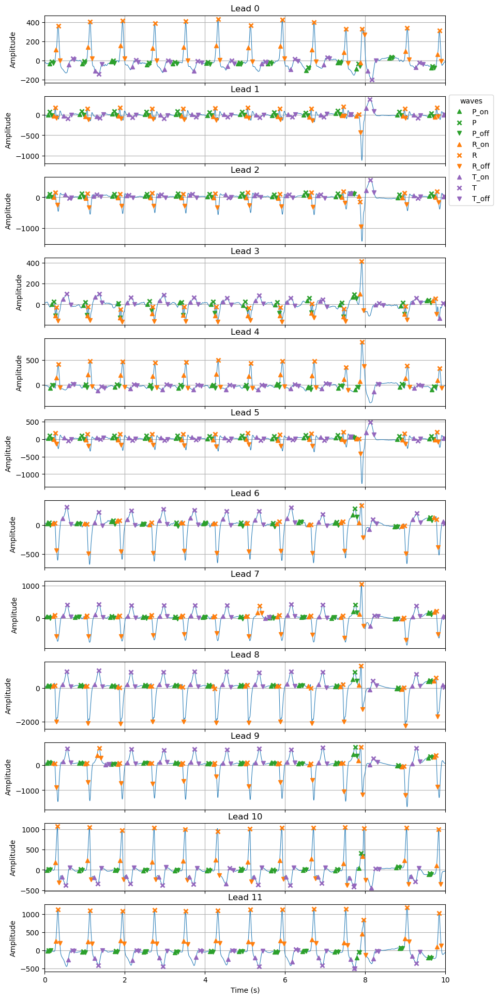

{'P': [array([  90,  491,  853, 1298, 1622, 2034, 2433, 2809, 3285, 3681, 3913,
       4324, 4838]), array([  65,  461,  867, 1271, 1658, 2056, 2464, 2859, 3255, 3655, 4424,
       4822]), array([  65,  464,  868, 1272, 1659, 2057, 2464, 2862, 3257, 3656, 3840,
       4426, 4822]), array([ 112,  504,  921, 1308, 1707, 2098, 2501, 2901, 3299, 3704, 3863,
       4469, 4789]), array([  94,  514,  902, 1322, 1691, 2107, 2515, 2912, 3308, 3686, 3903,
       4453, 4853]), array([  65,  463,  868, 1271, 1658, 2056, 2464, 2861, 3256, 3656, 3837,
       4425, 4822]), array([  53,  422,  854, 1232, 1645, 2002, 2450, 2850, 3191, 3643, 3867,
       4376, 4809]), array([  50,  404,  839, 1241, 1630, 1996, 2448, 2831, 3215, 3601, 3872,
       4380, 4807]), array([  53,  450,  856, 1257, 1644, 2046, 2451, 2849, 3194, 3644, 3868,
       4412, 4811]), array([  53,  452,  854, 1256, 1644, 2045, 2451, 2849, 3190, 3645, 3872,
       4412, 4812]), array([  52,  449,  888, 1256, 1646, 2045, 2448, 2847, 3243

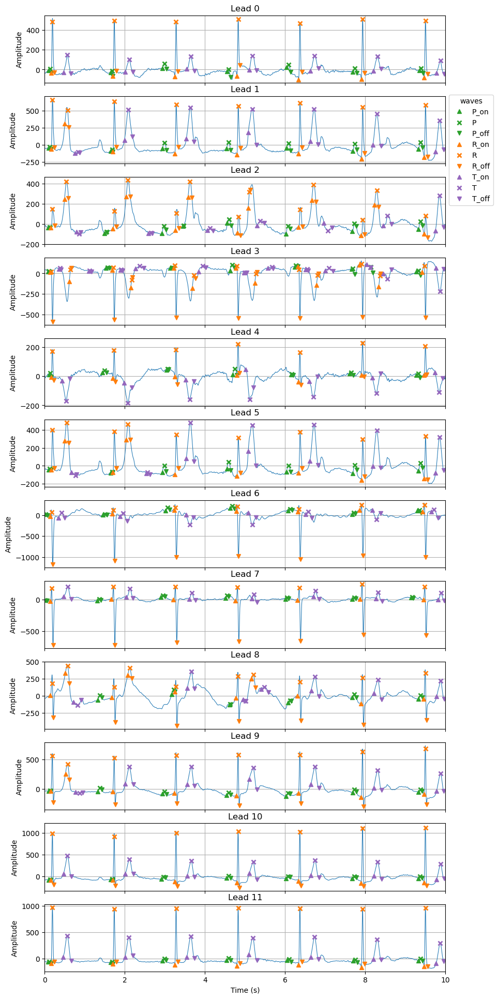

{'P': [array([  67,  841, 1495, 2294, 3043, 3870, 4693]), array([  65,  841, 1495, 2294, 3043, 3868, 4687]), array([  59,  770, 1486, 1730, 2302, 3038, 3863, 4686]), array([  48,  785, 1590, 2337, 3135, 3842, 4071, 4660]), array([  68,  744, 1534, 2373, 3083, 3826, 4663]), array([  60,  843, 1491, 2297, 3042, 3866, 4686]), array([   9,  752, 1534, 2341, 3064, 3857, 4674]), array([   6,  679, 1477, 2278, 3023, 3859, 4584]), array([ 687, 1611, 2313, 3062, 3862, 4686]), array([  70,  687, 1496, 2295, 3034, 3862, 4685]), array([  69,  842, 1481, 2293, 3036, 3864, 4684]), array([  57,  842, 1491, 2294, 3049, 3875, 4689])], 'R': [array([  95,  869, 1639, 2414, 3184, 3966, 4750]), array([  97,  286,  869, 1640, 2414, 3185, 3967, 4751]), array([  97,  268,  868, 1039, 1640, 1811, 2415, 2555, 3185, 3353, 3967,
       4145, 4751]), array([  84,  323,  854, 1088, 1624, 1862, 2400, 2637, 3173, 3407, 3954,
       4184, 4738]), array([  94,  865, 1636, 2411, 3182, 3964, 4749]), array([  97,  277,  8

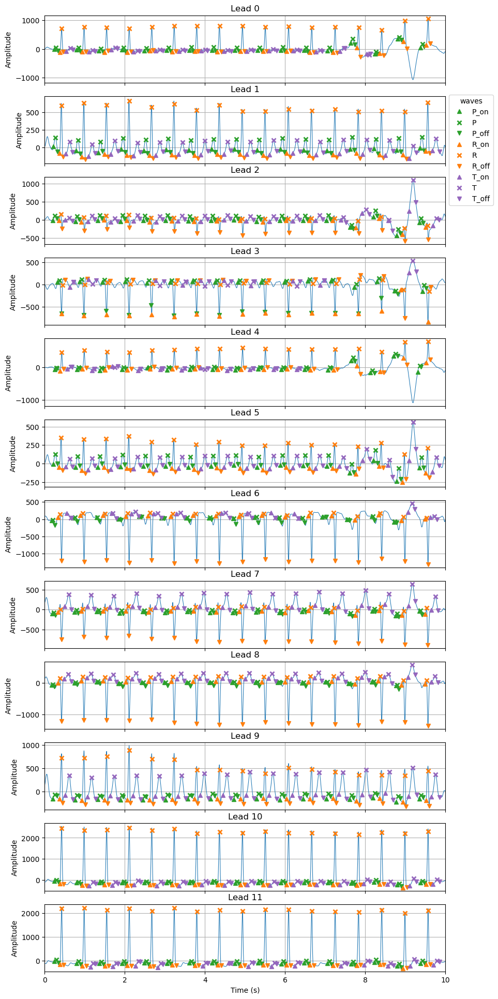

{'P': [array([ 140,  421,  703,  984, 1267, 1545, 1827, 2110, 2396, 2681, 2972,
       3260, 3553, 3844, 4136, 4422, 4713]), array([ 135,  415,  693,  977, 1259, 1539, 1821, 2104, 2391, 2677, 2966,
       3253, 3546, 3837, 4131, 4417, 4707]), array([ 128,  407,  688,  971, 1252, 1531, 1813, 2097, 2383, 2667, 2958,
       3247, 3538, 3829, 4124, 4413, 4697]), array([ 185,  464,  743, 1026, 1303, 1587, 1869, 2152, 2438, 2724, 3014,
       3304, 3596, 3890, 4170, 4380, 4736]), array([ 143,  425,  704,  986, 1304, 1547, 1829, 2113, 2398, 2687, 2976,
       3263, 3556, 3846, 4086, 4376, 4679]), array([ 131,  411,  690,  974, 1255, 1534, 1816, 2099, 2386, 2671, 2962,
       3250, 3542, 3832, 4128, 4415, 4701]), array([  99,  377,  658,  927, 1183, 1469, 1781, 2059, 2357, 2640, 2927,
       3217, 3489, 3781, 4091, 4367]), array([ 116,  398,  677,  960, 1241, 1523, 1803, 2088, 2373, 2658, 2947,
       3237, 3528, 3818, 4111, 4400, 4687]), array([  98,  382,  661,  948, 1229, 1508, 1792, 2083, 

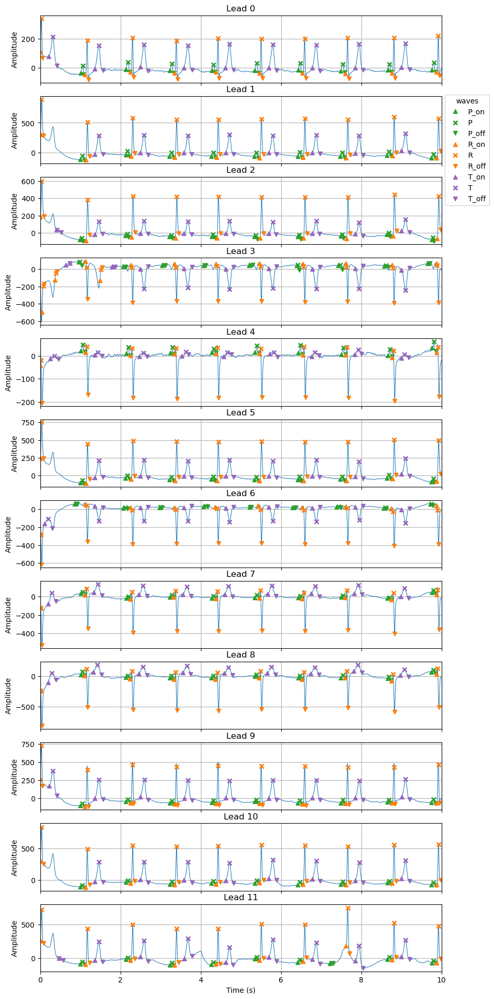

{'P': [array([ 529, 1094, 1641, 2161, 2698, 3239, 3772, 4354, 4904]), array([ 524, 1090, 1636, 2156, 2693, 3233, 3766, 4346, 4898]), array([ 521, 1087, 1633, 2154, 2690, 3230, 3763, 4344, 4895]), array([ 494, 1045, 1543, 2049, 2624, 3207, 3740, 4304, 4842]), array([ 532, 1098, 1645, 2164, 2702, 3243, 3777, 4356, 4907]), array([ 523, 1089, 1635, 2155, 2692, 3232, 3765, 4345, 4897]), array([ 451, 1060, 1497, 2059, 2619, 3159, 3721, 4298, 4871]), array([ 530, 1097, 1641, 2159, 2699, 3240, 3774, 4352, 4903]), array([ 525, 1092, 1637, 2157, 2695, 3235, 3769, 4348, 4899]), array([ 525, 1091, 1639, 2158, 2695, 3234, 3768, 4348, 4901]), array([ 526, 1092, 1639, 2158, 2697, 3235, 3768, 4349, 4901]), array([ 528, 1092, 1640, 2160, 2697, 3237, 3633, 4350, 4903])], 'R': [array([  15,  587, 1152, 1699, 2215, 2755, 3297, 3831, 4409, 4961]), array([  19,  588, 1154, 1701, 2220, 2757, 3298, 3834, 4411, 4965]), array([  19,  592, 1157, 1703, 2221, 2760, 3301, 3836, 4414, 4966]), array([  39,  199,  576

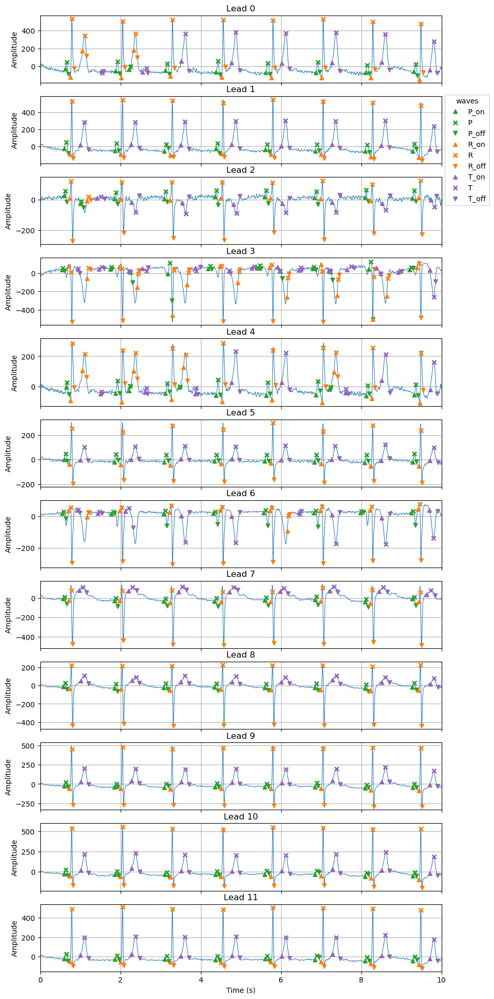

{'P': [array([ 329,  962, 1123, 1585, 2215, 2833, 3458, 4077, 4678]), array([ 325,  954, 1571, 2212, 2829, 3451, 4075, 4664]), array([ 315,  513,  945, 1567, 2195, 2819, 3440, 4064, 4662]), array([ 279,  884, 1126, 1617, 2121, 2738, 2989, 3410, 3619, 4121, 4620]), array([ 330,  963, 1122, 1585, 1737, 2216, 2835, 3459, 3614, 4078, 4679]), array([ 316,  947, 1569, 2197, 2821, 3442, 4065, 4664]), array([ 291,  912, 1557, 2182, 2810, 3435, 4005, 4650]), array([ 309,  943, 1562, 2196, 2817, 3442, 4061, 4658]), array([ 312,  945, 1565, 2197, 2819, 3443, 4063, 4661]), array([ 319,  949, 1569, 2200, 2822, 3446, 4065, 4664]), array([ 321,  955, 1579, 2206, 2824, 3447, 4065, 4665]), array([ 323,  957, 1579, 2208, 2831, 3447, 4074, 4666])], 'R': [array([ 395,  558, 1028, 1188, 1648, 2280, 2901, 3526, 4146, 4744]), array([ 395, 1027, 1648, 2281, 2901, 3527, 4145, 4745]), array([ 386,  602, 1019, 1640, 2268, 2894, 3518, 4136, 4737]), array([ 382,  605, 1014, 1223, 1668, 1846, 2264, 2480, 2885, 3090

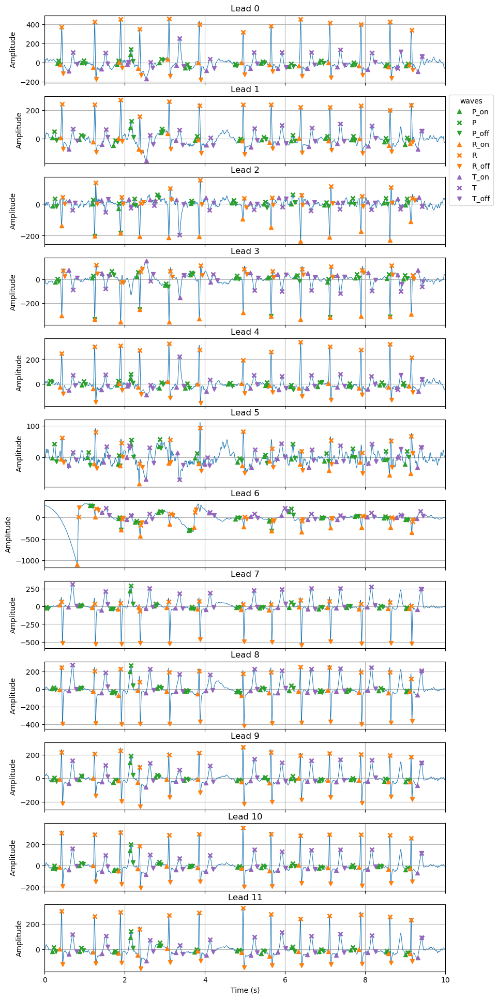

{'P': [array([ 172,  486,  920, 1077, 1457, 1779, 2378, 2717, 3075, 3450, 3857,
       4276, 4535]), array([ 121,  455,  881, 1079, 1461, 1901, 2445, 2731, 3097, 3527, 3846,
       4253, 4517]), array([ 124,  605,  927, 1122, 1401, 1831, 2359, 2752, 3097, 3515, 3842,
       4253, 4523]), array([ 158,  606,  837, 1167, 1513, 1829, 2398, 2803, 3154, 3539, 3897,
       4291, 4492]), array([  70,  487,  918, 1075, 1453, 1780, 2315, 2770, 3075, 3432, 3804,
       4205, 4474]), array([ 122,  547,  927, 1082, 1433, 1899, 2431, 2751, 3097, 3514, 3844,
       4253, 4522]), array([ 573,  931, 1144, 1441, 1811, 2404, 2809, 3074, 3458, 3891, 4252,
       4511]), array([  19,  450,  830, 1076, 1384, 1837, 2410, 2709, 3074, 3440, 3793,
       4193, 4515]), array([ 111,  451,  855, 1076, 1432, 1767, 2414, 2714, 3075, 3439, 3792,
       4191, 4523]), array([ 121,  454,  883, 1077, 1406, 1766, 2423, 2752, 3095, 3442, 3841,
       4252, 4525]), array([ 123,  455,  888, 1077, 1431, 1815, 2429, 2724, 3093

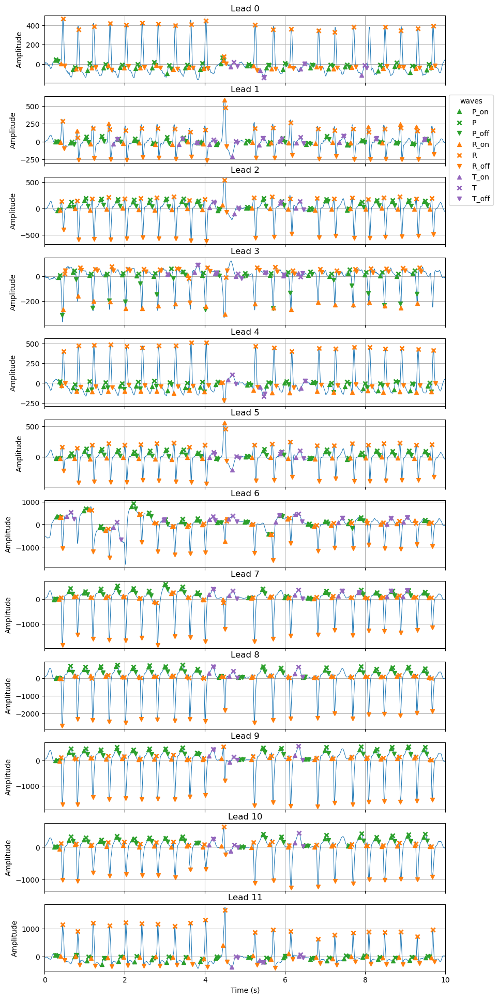

{'P': [array([ 139,  378,  558,  760,  967, 1161, 1362, 1552, 1780, 1965, 2218,
       2545, 2789, 2999, 3330, 3565, 3771, 4185, 4393, 4583, 4793]), array([ 145,  342,  522,  714,  919, 1129, 1360, 1525, 1733, 1933, 2149,
       2528, 2810, 2974, 3287, 3523, 3791, 3965, 4190, 4394, 4595, 4759]), array([ 182,  332,  516,  708,  916, 1114, 1314, 1518, 1731, 1917, 2174,
       2527, 2736, 2957, 3311, 3511, 3794, 3956, 4144, 4337, 4544, 4749]), array([ 194,  369,  575,  777,  981, 1169, 1375, 1578, 1725, 1978, 2159,
       2502, 2824, 3034, 3313, 3577, 3806, 4010, 4212, 4413, 4615]), array([ 189,  376,  559,  761,  966, 1164, 1363, 1558, 1779, 1965, 2161,
       2546, 2789, 3019, 3352, 3579, 3771, 3997, 4184, 4381, 4584, 4801]), array([ 163,  334,  519,  712,  917, 1119, 1315, 1520, 1731, 1919, 2149,
       2527, 2737, 2957, 3309, 3520, 3792, 3960, 4146, 4339, 4544, 4752]), array([ 170,  514,  703, 1109, 1299, 1506, 1720, 1909, 2179, 2506, 2806,
       2943, 3298, 3511, 3808, 3947, 4747]),

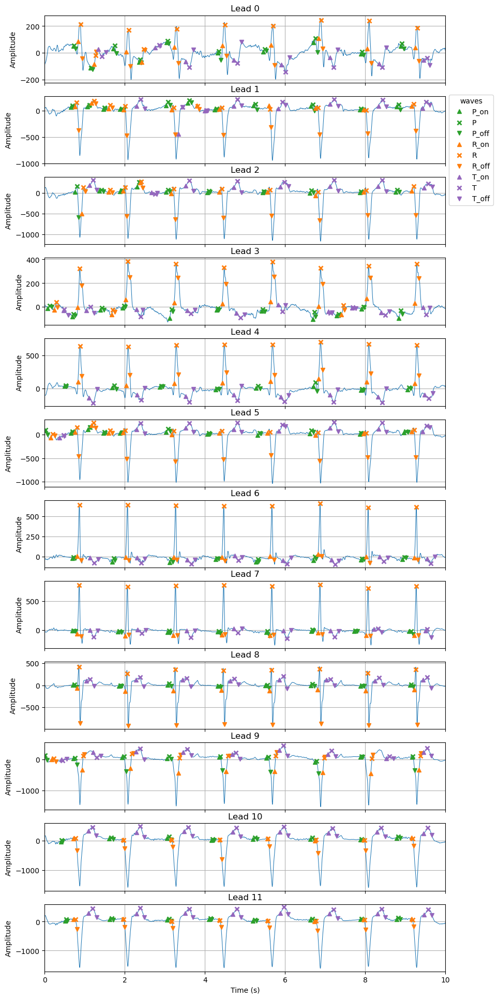

{'P': [array([ 362,  576,  872, 1192, 1533, 2173, 2748, 3378, 3957, 4458]), array([ 346,  559,  744,  967, 1537, 1807, 2146, 2627, 3343, 3948, 4414]), array([ 401,  707,  965, 1178, 1538, 2051, 2733, 3325, 3945, 4398]), array([  62,  357,  716,  994, 1583, 2158, 2720, 3368, 3667, 3976, 4442]), array([ 261,  866, 1455, 2152, 2664, 3375, 3957, 4544]), array([  12,  346,  564,  744,  966, 1537, 2050, 2682, 3325, 3944, 4509]), array([ 360,  861, 1581, 2153, 2659, 3371, 3960, 4490]), array([ 358,  936, 1552, 2169, 2776, 3340, 3873, 4572]), array([ 374,  948, 1551, 2172, 2775, 3339, 3958, 4573]), array([   2,  379,  989, 1552, 2189, 2791, 3390, 3953, 4592]), array([ 213,  830, 1553, 2094, 2621, 3337, 3952, 4413]), array([ 271,  833, 1553, 2067, 2621, 3337, 3953, 4413])], 'R': [array([ 446,  635, 1046, 1237, 1648, 2248, 2849, 3448, 4049, 4650]), array([ 400,  618,  818, 1004, 1608, 1909, 2208, 2809, 3410, 4010, 4603]), array([ 483,  818, 1007, 1201, 1608, 2208, 2809, 3410, 4010, 4603]), array

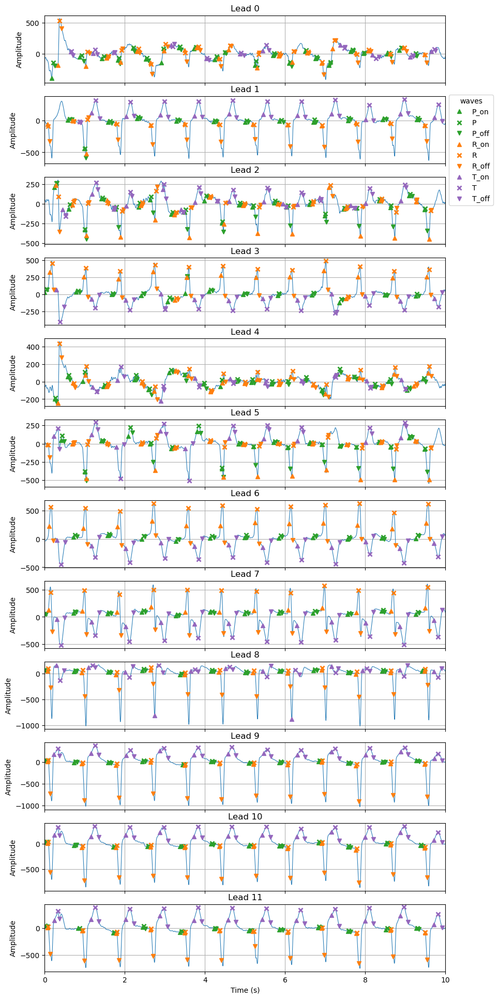

{'P': [array([ 109,  460,  737,  927, 1106, 1277, 1480, 1688, 1885, 2143, 2250,
       2637, 2863, 3059, 3260, 3389, 3563, 3841, 3986, 4296, 4448, 4631]), array([ 312,  500,  819, 1166, 1658, 2124, 2518, 2952, 3367, 3794, 4242,
       4656]), array([ 148,  313,  503,  720,  895, 1182, 1327, 1598, 1756, 2019, 2217,
       2435, 2602, 2874, 3039, 3323, 3501, 3741, 3892, 4181, 4321, 4560,
       4749]), array([  24,  416,  848, 1231, 1558, 1778, 2073, 2499, 2917, 3354, 3699,
       4249, 4642]), array([ 134,  300,  499,  755, 1138, 1310, 1580, 1745, 1989, 2208, 2403,
       2589, 2838, 3033, 3259, 3464, 3681, 3863, 4123, 4312, 4548, 4730]), array([ 217,  502,  721, 1067, 1326, 1591, 1923, 2213, 2435, 2605, 2874,
       3037, 3324, 3460, 3690, 3887, 4181, 4319, 4560, 4747]), array([ 378,  804, 1236, 1659, 2087, 2514, 2943, 3372, 3797, 4223, 4655]), array([   4,  381,  803, 1235, 1659, 2086, 2514, 2942, 3373, 3795, 4224,
       4654]), array([  18,  384,  801, 1235, 1705, 2086, 2513, 2942, 

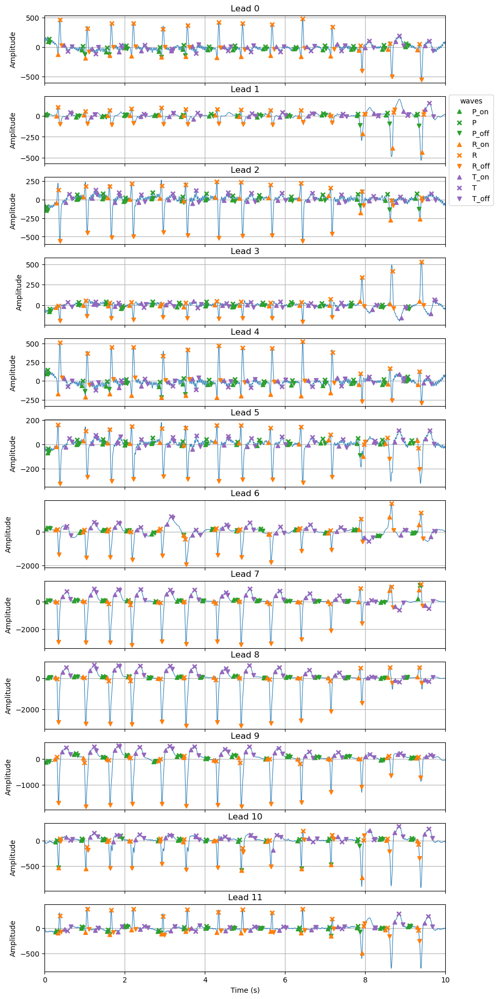

{'P': [array([  54,  475,  780, 1017, 1434, 1730, 2050, 2369, 2752, 3132, 3493,
       3849, 4227, 4508]), array([  13,  410,  740, 1005, 1391, 1724, 2077, 2404, 2673, 3038, 3476,
       3910, 4276, 4646]), array([  24,  407,  728, 1007, 1343, 1717, 2014, 2347, 2674, 3075, 3467,
       3906, 4275, 4645]), array([  64,  424,  768,  963, 1343, 1677, 2014, 2347, 2721, 3075, 3454,
       3820, 4211, 4535]), array([  34,  475,  777, 1017, 1434, 1730, 2050, 2369, 2732, 3089, 3493,
       3849, 4227, 4525]), array([  44,  407,  728, 1007, 1343, 1717, 2014, 2401, 2674, 3038, 3467,
       3907, 4211, 4575]), array([  44,  464,  746, 1029, 1361, 1734, 2091, 2399, 2695, 3142, 3521,
       3860, 4158, 4597]), array([  44,  388,  728, 1045, 1382, 1676, 1973, 2379, 2656, 3038, 3397,
       3777, 4216, 4680]), array([  64,  388,  728, 1046, 1303, 1676, 1953, 2379, 2742, 3038, 3397,
       3777, 4216, 4515]), array([  43,  388,  727, 1026, 1383, 1677, 2014, 2361, 2762, 3038, 3397,
       3777, 4212, 4

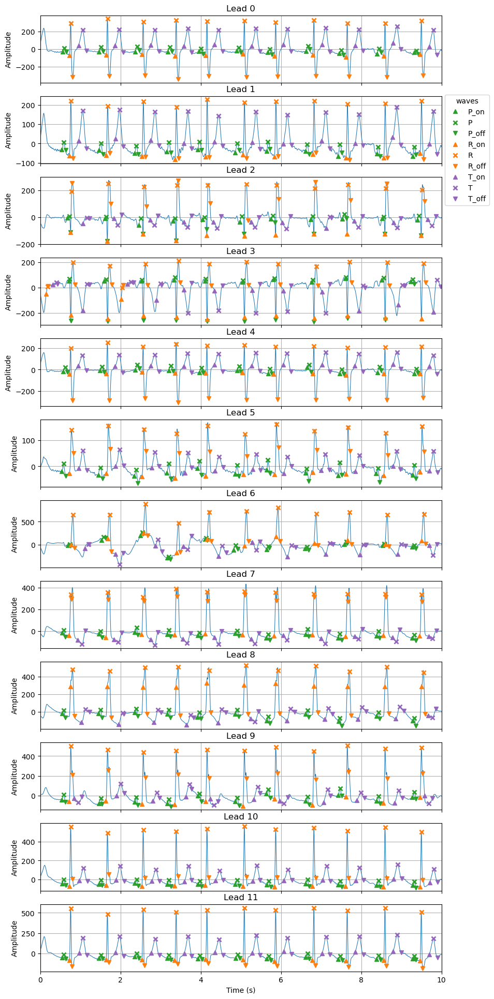

{'P': [array([ 303,  760, 1208, 1614, 2004, 2473, 2860, 3336, 3750, 4223, 4689]), array([ 292,  758, 1195, 1603, 1984, 2454, 2838, 3328, 3734, 4209, 4659]), array([ 366,  823, 1256, 1680, 2047, 2515, 2901, 3394, 3791, 4283, 4722]), array([ 364,  822, 1268, 1680, 2063, 2528, 2917, 3395, 3810, 4280, 4641]), array([ 313,  772, 1210, 1628, 2007, 2478, 2864, 3352, 3756, 4226, 4684]), array([ 291,  750, 1194, 1601, 1983, 2452, 2838, 3322, 3733, 4207, 4659]), array([ 371,  792, 1275, 1602, 2069, 2436, 2842, 3328, 3818, 4287, 4660]), array([ 294,  752, 1200, 1605, 1985, 2456, 2842, 3330, 3735, 4215, 4663]), array([ 293,  751, 1198, 1604, 1985, 2455, 2842, 3329, 3734, 4213, 4662]), array([ 294,  755, 1199, 1605, 1985, 2457, 2841, 3329, 3737, 4214, 4663]), array([ 295,  756, 1200, 1605, 1989, 2457, 2846, 3329, 3736, 4214, 4663]), array([ 296,  756, 1201, 1606, 1990, 2460, 2848, 3330, 3738, 4216, 4664])], 'R': [array([ 382,  839, 1284, 1696, 2079, 2545, 2935, 3411, 3826, 4298, 4750]), array([ 383

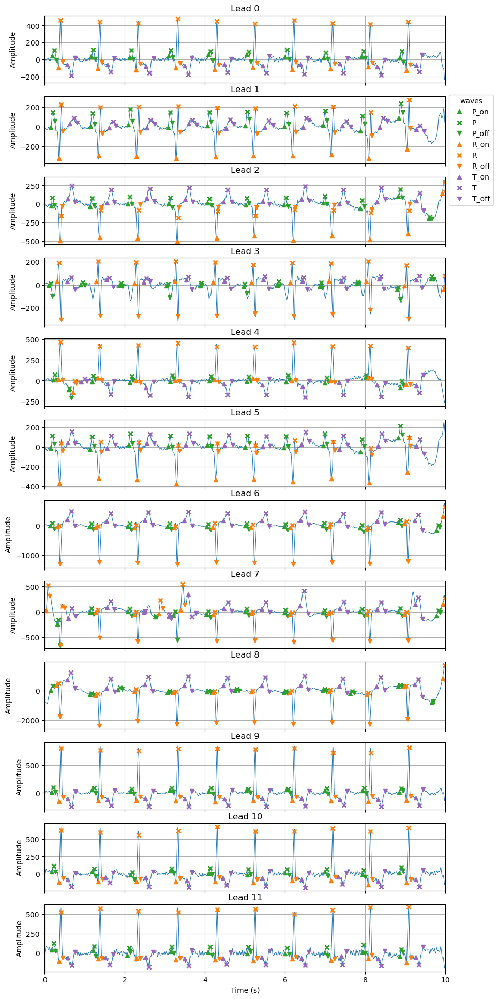

{'P': [array([ 120,  603, 1084, 1574, 2070, 2546, 3023, 3508, 3975, 4453]), array([ 102,  596, 1070, 1563, 2053, 2527, 3016, 3498, 3963, 4441]), array([  96,  590, 1061, 1564, 2057, 2522, 3010, 3497, 3959, 4437, 4802]), array([  72,  474,  955, 1537, 1951, 2492, 2918, 3447, 3907, 4410, 4829]), array([ 127,  307,  605, 1087, 1588, 2072, 2547, 3035, 3520, 4013, 4456]), array([  97,  593, 1071, 1563, 2056, 2526, 3012, 3497, 3960, 4438]), array([  94,  585, 1061, 1556, 2044, 2520, 3006, 3489, 3957, 4434, 4914]), array([ 172,  585, 1060, 1387, 1631, 2044, 2521, 3006, 3491, 3957, 4435,
       4914]), array([ 101,  587,  941, 1559, 2045, 2399, 3009, 3492, 3837, 4436, 4845]), array([ 110,  615, 1090, 1582, 2074, 2540, 3035, 3518, 3985, 4446]), array([ 111,  615, 1096, 1584, 2063, 2539, 3025, 3518, 3975, 4446]), array([ 111,  616, 1053, 1585, 2063, 2539, 3024, 3519, 3975, 4446])], 'R': [array([ 196,  690, 1168, 1661, 2149, 2623, 3111, 3593, 4061, 4536]), array([ 205,  696, 1172, 1666, 2154, 263

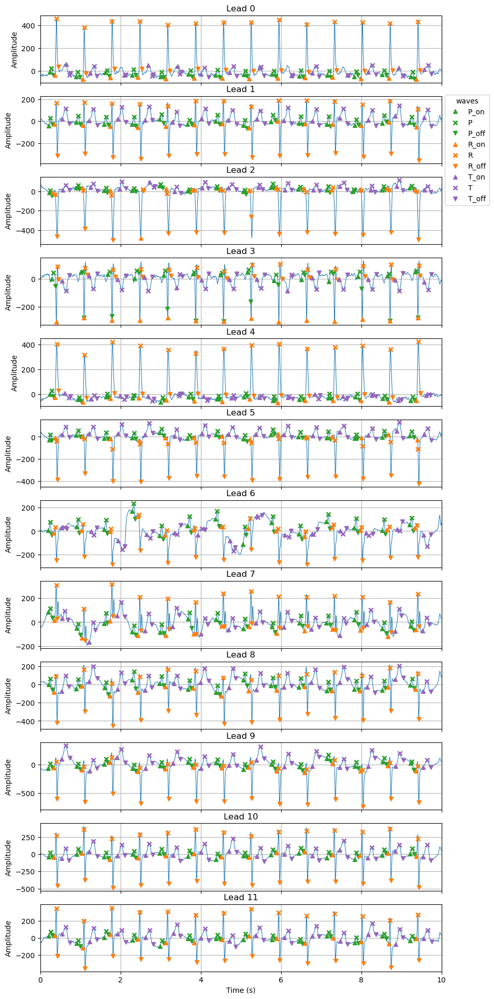

{'P': [array([ 141,  470,  834, 1167, 1514, 1871, 2211, 2558, 2910, 3247, 3601,
       3936, 4288, 4640]), array([ 127,  474,  821, 1168, 1514, 1861, 2210, 2553, 2900, 3245, 3594,
       3937, 4285, 4631]), array([ 127,  475,  822, 1169, 1502, 1859, 2206, 2552, 2898, 3241, 3593,
       3908, 4283, 4628]), array([ 167,  530,  869, 1203, 1561, 1920, 2267, 2598, 2939, 3278, 3621,
       3981, 4343, 4686]), array([ 142,  486,  835, 1162, 1527, 1873, 2225, 2563, 2912, 3250, 3606,
       3952, 4295, 4643]), array([ 127,  475,  821, 1168, 1514, 1860, 2209, 2552, 2899, 3244, 3593,
       3937, 4284, 4629]), array([ 125,  471,  820, 1166, 1513, 1861, 2206, 2553, 2897, 3244, 3591,
       3938, 4285, 4629]), array([ 125,  472,  821, 1168, 1514, 1862, 2208, 2553, 2899, 3245, 3592,
       3938, 4285, 4632]), array([ 126,  474,  821, 1168, 1515, 1864, 2210, 2552, 2900, 3246, 3593,
       3939, 4286, 4633]), array([ 127,  474,  822, 1168, 1514, 1862, 2209, 2554, 2899, 3245, 3592,
       3939, 4285, 4

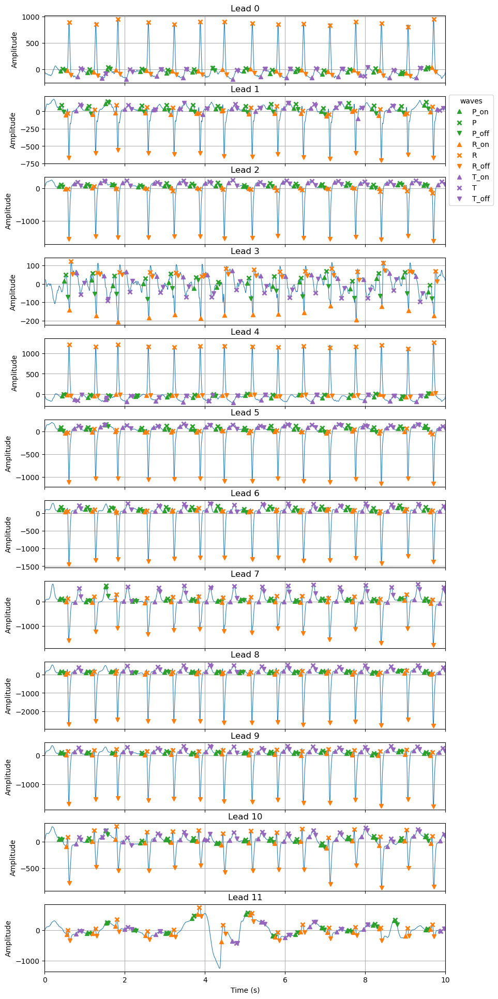

{'P': [array([ 225,  560,  789, 1210, 1535, 1865, 2097, 2509, 2834, 3154, 3480,
       3805, 4125, 4461, 4780]), array([ 210,  553,  782, 1209, 1518, 1846, 2159, 2505, 2823, 3134, 3472,
       3788, 4109, 4447, 4760]), array([ 201,  534,  845, 1192, 1518, 1835, 2161, 2490, 2811, 3130, 3462,
       3779, 4103, 4432, 4747]), array([ 265,  597,  867, 1255, 1569, 1889, 2167, 2549, 2865, 3197, 3514,
       3836, 4162, 4494, 4807]), array([ 239,  563,  790, 1152, 1553, 1871, 2110, 2526, 2845, 3185, 3486,
       3814, 4129, 4465, 4784]), array([ 207,  537,  764, 1209, 1518, 1845, 2160, 2491, 2820, 3132, 3464,
       3785, 4107, 4435, 4755]), array([ 201,  534,  831, 1191, 1516, 1837, 2161, 2487, 2809, 3127, 3455,
       3779, 4100, 4430, 4750]), array([ 210,  537,  763, 1118, 1535, 1851, 2179, 2464, 2823, 3142, 3464,
       3790, 4107, 4449, 4761]), array([ 208,  538,  850, 1114, 1520, 1845, 2162, 2454, 2821, 3132, 3467,
       3786, 4106, 4432, 4761]), array([ 213,  548,  847, 1213, 1520, 18

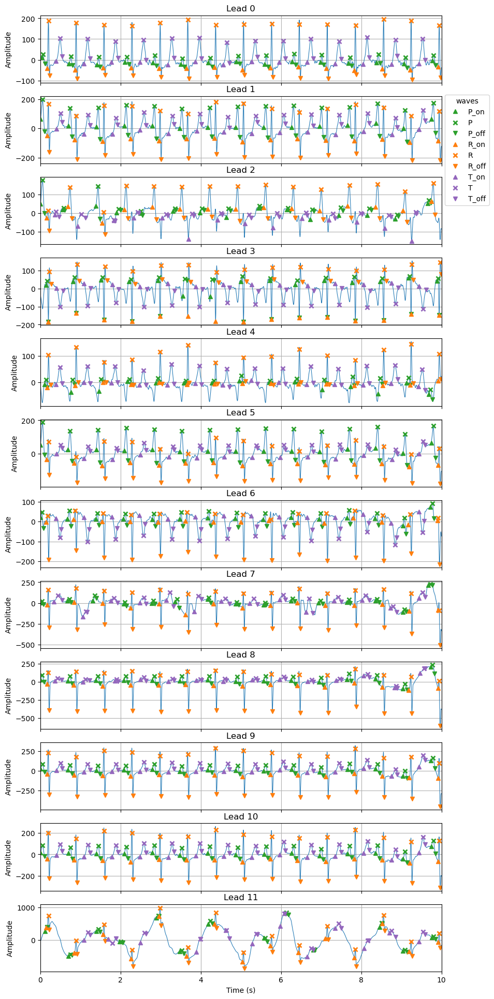

{'P': [array([  33,  383,  729, 1081, 1428, 1774, 2118, 2469, 2819, 3162, 3509,
       3861, 4213, 4552, 4903]), array([  30,  374,  723, 1071, 1423, 1766, 2113, 2459, 2811, 3156, 3505,
       3853, 4206, 4548, 4898]), array([  29,  293,  721,  978, 1257, 1678, 2015, 2345, 2734, 3090, 3388,
       3745, 4098, 4449, 4841]), array([  88,  432,  779, 1129, 1480, 1801, 2147, 2518, 2868, 3203, 3561,
       3912, 4263, 4606, 4956]), array([  77,  406,  757, 1115, 1465, 1814, 2164, 2505, 2863, 3197, 3537,
       3894, 4237, 4590, 4863]), array([  29,  373,  722, 1071, 1422, 1766, 2113, 2459, 2810, 3155, 3504,
       3852, 4205, 4547, 4898]), array([  20,  363,  711, 1060, 1413, 1755, 2103, 2450, 2801, 3145, 3494,
       3845, 4195, 4538, 4886]), array([  20,  365,  682, 1057, 1412, 1707, 2102, 2449, 2801, 3145, 3494,
       3845, 4195, 4540, 4862]), array([  25,  371,  718, 1066, 1420, 1762, 2109, 2455, 2807, 3153, 3500,
       3850, 4199, 4545, 4889]), array([  29,  373,  722, 1069, 1422, 17

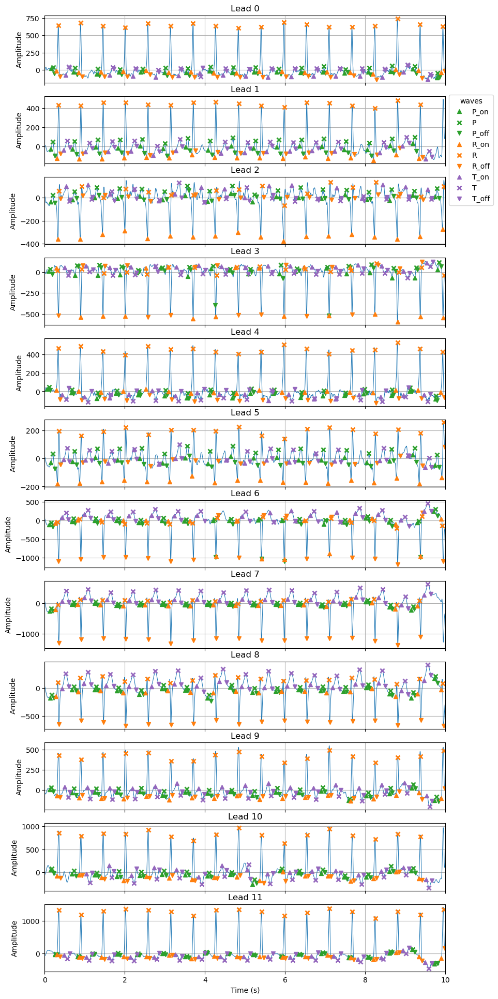

{'P': [array([ 106,  379,  662,  938, 1220, 1504, 1785, 2067, 2351, 2629, 2918,
       3201, 3481, 3753, 4049, 4336, 4619, 4902]), array([ 102,  373,  659,  937, 1217, 1502, 1784, 2064, 2349, 2631, 2917,
       3201, 3480, 3759, 4047, 4334, 4616]), array([ 100,  371,  650,  931, 1211, 1493, 1775, 2057, 2342, 2618, 2910,
       3191, 3471, 3763, 4040, 4326, 4613, 4893]), array([  68,  402,  681,  959, 1162, 1467, 1804, 2103, 2313, 2566, 2949,
       3145, 3526, 3789, 4078, 4354, 4635, 4921]), array([  55,  341,  665,  898, 1175, 1504, 1785, 2068, 2352, 2577, 2860,
       3201, 3481, 3751, 3992, 4336, 4559, 4881]), array([ 102,  372,  657,  934, 1212, 1495, 1776, 2059, 2345, 2632, 2916,
       3192, 3475, 3766, 4042, 4327, 4614, 4894]), array([  82,  361,  639,  917, 1197, 1481, 1765, 2117, 2326, 2685, 2970,
       3178, 3503, 3745, 4027, 4313, 4669, 4874]), array([  84,  362,  639,  917, 1200, 1481, 1768, 2046, 2328, 2613, 2900,
       3183, 3463, 3746, 4031, 4312, 4597]), array([  88, 

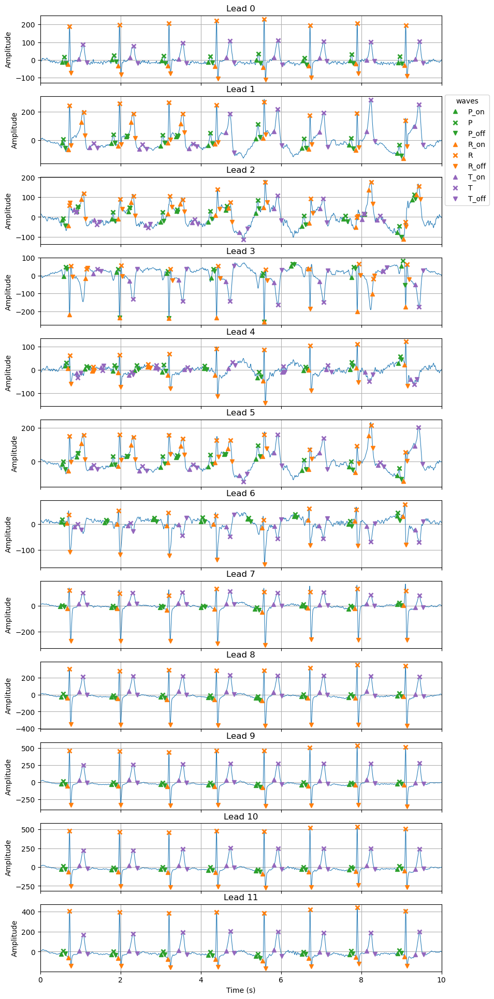

{'P': [array([ 299,  919, 1540, 2120, 2719, 3295, 3878, 4483]), array([ 287,  910, 1083, 1527, 1706, 2120, 2714, 3286, 3872, 4473]), array([ 285,  466,  909, 1111, 1525, 1706, 2120, 2326, 2710, 3285, 3805,
       4039, 4473, 4658]), array([ 319,  972, 1589, 2157, 2775, 3148, 3905, 4522]), array([ 327,  580,  923, 1200, 1540, 2051, 2724, 3304, 3882, 4485]), array([ 286,  467,  909, 1083, 1526, 1706, 2120, 2300, 2713, 3285, 3871,
       4473]), array([ 273,  822, 1425, 2022, 2599, 3177, 3864, 4456]), array([ 274,  905, 1508, 2030, 2699, 3278, 3868, 4472]), array([ 287,  910, 1527, 2118, 2710, 3282, 3868, 4474]), array([ 289,  911, 1527, 2118, 2711, 3281, 3871, 4473]), array([ 289,  912, 1528, 2117, 2712, 3282, 3871, 4474]), array([ 288,  912, 1529, 2120, 2714, 3280, 3871, 4477])], 'R': [array([ 367,  990, 1606, 2198, 2792, 3362, 3951, 4555]), array([ 365,  542,  987, 1164, 1604, 1780, 2197, 2789, 3361, 3948, 4551]), array([ 365,  542,  995, 1164, 1615, 1780, 2208, 2369, 2801, 3374, 3948,

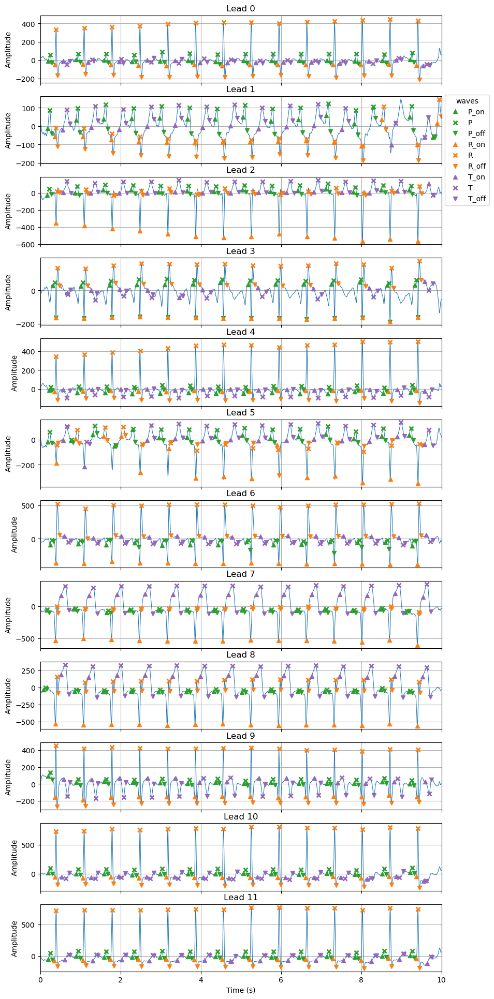

{'P': [array([ 124,  474,  823, 1170, 1517, 1864, 2210, 2556, 2903, 3249, 3595,
       3941, 4286, 4633]), array([ 120,  470,  815, 1165, 1513, 1858, 2205, 2551, 2896, 3243, 3590,
       3935, 4152, 4626, 4907]), array([ 114,  463,  811, 1156, 1499, 1851, 2188, 2544, 2890, 3236, 3583,
       3927, 4274, 4620]), array([ 182,  532,  880, 1227, 1575, 1921, 2268, 2614, 2960, 3306, 3653,
       3999, 4343, 4690]), array([ 129,  478,  826, 1173, 1518, 1866, 2213, 2559, 2906, 3253, 3598,
       3944, 4288, 4636]), array([ 117,  389,  682,  939, 1159, 1506, 1853, 2200, 2547, 2892, 3238,
       3585, 3931, 4277, 4622]), array([ 145,  500,  847, 1205, 1544, 1890, 2239, 2594, 2929, 3281, 3634,
       3976, 4323, 4657]), array([  89,  443,  847, 1133, 1490, 1838, 2182, 2531, 2878, 3213, 3566,
       3914, 4262, 4574]), array([  68,  451,  798, 1145, 1496, 1841, 2187, 2532, 2881, 3227, 3572,
       3918, 4264, 4609]), array([ 124,  472,  820, 1169, 1517, 1862, 2209, 2556, 2901, 3248, 3594,
       3

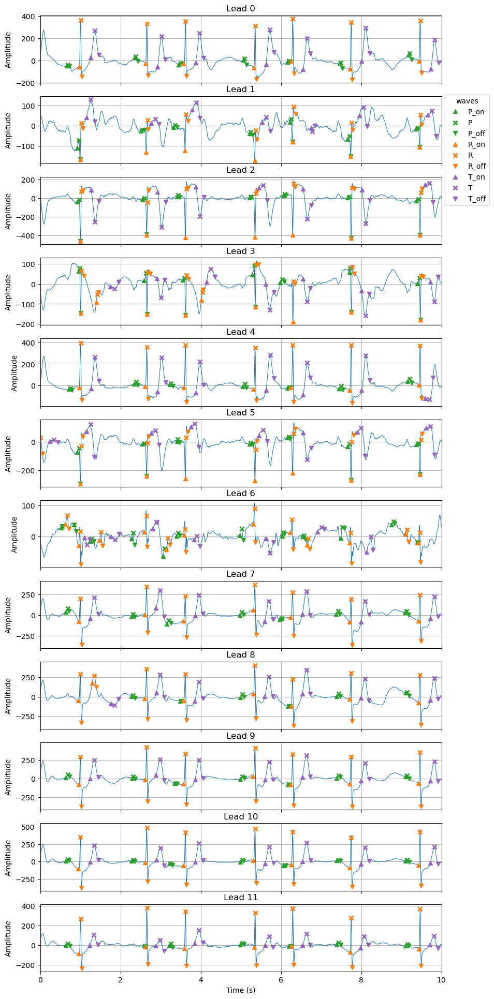

{'P': [array([ 347, 1193, 1753, 2548, 3103, 3747, 4603]), array([ 483, 1275, 1680, 2620, 3126, 3854, 4707]), array([ 484, 1302, 1716, 2620, 3048, 3855, 4712]), array([ 491, 1318, 1799, 2667, 3015, 3864, 4723]), array([ 376, 1194, 1628, 2549, 3107, 3750, 4605]), array([ 484, 1301, 1715, 2620, 3098, 3854, 4712]), array([ 275,  422,  643, 1157, 1554, 1722, 2510, 3028, 3284, 3764, 4401,
       4702]), array([ 342, 1159, 1601, 2515, 3009, 3714, 4565]), array([1159, 1753, 2516, 3102, 3717, 4569]), array([ 342, 1161, 1686, 2517, 3094, 3718, 4572]), array([ 345, 1163, 1625, 2518, 3045, 3718, 4573]), array([ 345, 1305, 1626, 2518, 3118, 3717, 4575])], 'R': [array([ 504, 1330, 1811, 2679, 3148, 3876, 4736]), array([ 510, 1336, 1818, 2685, 3155, 3882, 4741]), array([ 513, 1336, 1820, 2688, 3158, 3886, 4744]), array([ 515,  714, 1341, 1823, 2023, 2690, 3160, 3888, 4747]), array([ 504, 1329, 1811, 2679, 3148, 3876, 4735]), array([   3,  510, 1336, 1818, 2685, 3155, 3883, 4742]), array([ 339,  497, 

IndexError: index 0 is out of bounds for axis 0 with size 0

In [38]:
import pickle
import os

directory = 'K://Tel/Disin/praktikum/git/prominence-delineator-main/new_data - Copy'

files = os.listdir(directory)

start_index = 26  # לדוגמה, להתחיל מהקובץ ה-6 ברשימה

for index, file in enumerate(files[start_index:], start=start_index):
    file_path = os.path.join(directory, file)
#     print(file)
    record_name = os.path.splitext(file)[0]
    record_name = ''.join(filter(str.isdigit, record_name))
#     file_number='1'
    printLeads(record_name) 